In [1]:
import json
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

In [2]:
from scripts.processing import process_datasets, load_datasets
from scripts.rf5_scorer import rf5_scorer, simulate_rf5_scorer
from scripts.charts import *

process_datasets(
    categories_path='data/categories.json',
    ballots_csv_path='data/_local/rf5_votes_final.csv',
    voters_csv_path='data/_local/rf5_voters.csv',
    voter_survey_csv_path='data/_local/rf5_survey.csv',
    projects_csv_path='data/_local/rf5_projects.csv',
    output_dir='data/_local/clean'
)

voting_data, df_all_votes, df_voters, df_projects = load_datasets('data/_local/clean')

Voters dataframe length: 124
Actual voters length: 111
Voters dataframe length after filtering: 111
Voters dataframe length after joining survey data: 111
Processing complete.


In [3]:
df = (
    df_all_votes
    .merge(df_projects, on='project_id')
    .merge(df_voters, on='voter_address')
)
df.tail(1)

,voter_address,project_id,project_percentage,project_amount,project_name,project_display_name,project_category,op_stack_category,expertise_score,expertise_group,voter_type,is_expert,is_citizen,used_pairwise,survey_hours_spent,survey_rate_voting_ux,survey_rate_worry_results,survey_rate_confidence_results,survey_rate_funding_influence
2925,0xfb0a98121c3939657e59f835c66cfe20abb0cd4f,0xb7ab34b29ac7c1f61777caa55b2b0e39de62a3a3f14c...,0.0421,112255.44,opUSDC,opUSDC,OP Stack R&D,OP Stack R&D,NaN,Non-expert,Citizen,False,True,False,NaN,NaN,NaN,NaN,NaN


# Part 1. High level observations

In [4]:
len(df_voters)

111

Text(0.0, 1.0, 'How big should the round be?\n')

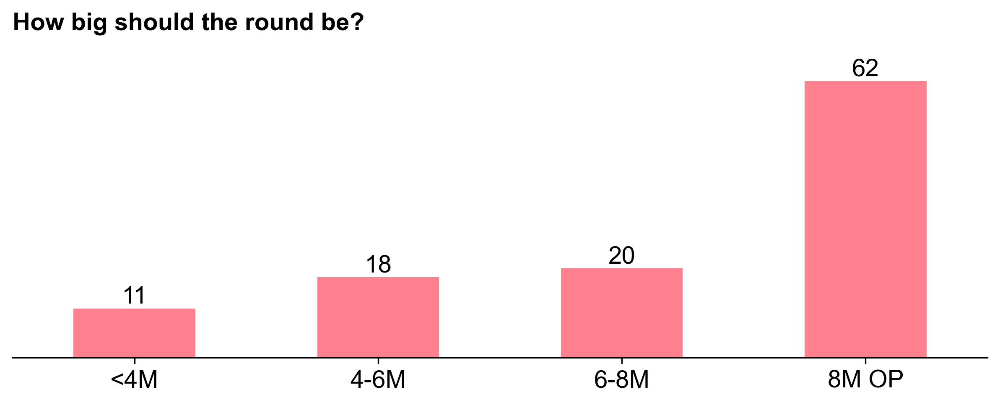

In [5]:
budgets = pd.Series([x['budget'] for x in voting_data])

bins = [0, 4000000, 6000000, 7990000, float('inf')]
labels = ['<4M', '4-6M', '6-8M', '8M OP']

budget_categories = pd.cut(budgets, bins=bins, labels=labels)
crosstab_budget = pd.crosstab(budget_categories, columns="count")

fig, ax = get_plot(crosstab_budget, kind='bar', color='#ff0420', alpha=.5)

ax.legend().remove()
ax.tick_params(axis='x', rotation=0)
ax.set_xlabel("")

ax.set_ylabel("")
ax.spines['left'].set_visible(False)
ax.set_yticks([])

for bars in ax.containers:
    labels = [f'{int(v)}' if v > 0 else '' for v in bars.datavalues]
    ax.bar_label(bars, labels=labels, label_type='edge')

ax.set_title(f"How big should the round be?\n", loc='left', weight='bold')

Text(0.0, 1.0, 'Composition of RF5 voters\n')

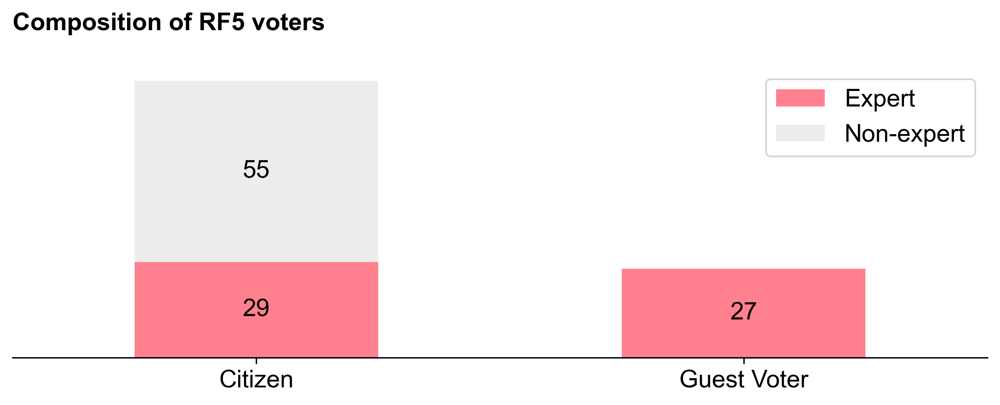

In [6]:
fig, ax = get_plot(
    pd.crosstab(df_voters.voter_type, df_voters.expertise_group),
    kind='bar',
    stacked=True,
    color=['#ff0420', '#ddd'],
    alpha=.5
)
ax.legend(loc='upper right')
ax.tick_params(axis='x', rotation=0)
ax.set_xlabel("")

ax.set_ylabel("")
ax.spines['left'].set_visible(False)
ax.set_yticks([])

for bars in ax.containers:
    labels = [f'{int(v)}' if v > 0 else '' for v in bars.datavalues]
    ax.bar_label(bars, labels=labels, label_type='center')

ax.set_title(f"Composition of RF5 voters\n", loc='left', weight='bold')

In [7]:
print("Conflicts of interest:", len(df_all_votes[df_all_votes['project_percentage'].isna()==True]))
print("Total votes:", len(df_all_votes))

Conflicts of interest: 19
Total votes: 2926


# Part 2. Comparing distribution curves

Max: 234544.68116043194
Share to max: 0.02931808514505399
Min: 36969.12446543613


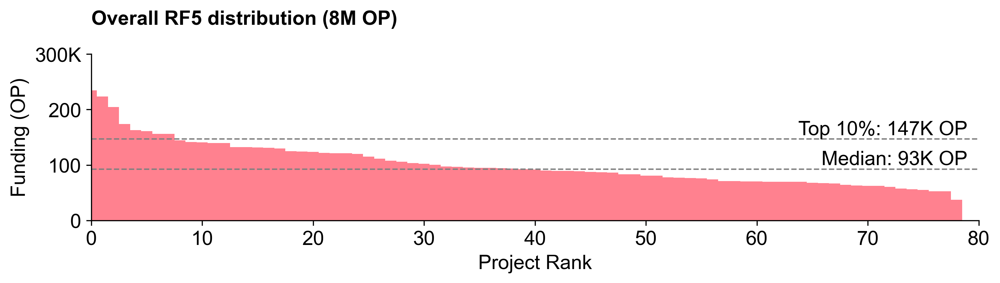

In [8]:
r5_data = rf5_scorer(voting_data)['rf5_rewards']
r5_dist = distributions_barchart(
    r5_data,
    title='Overall RF5 distribution (8M OP)',
    ymax=300,
    xstep=10
)

print("Max:", r5_data.max())
print("Share to max:", r5_data.max() / r5_data.sum())
print("Min:", r5_data.min())

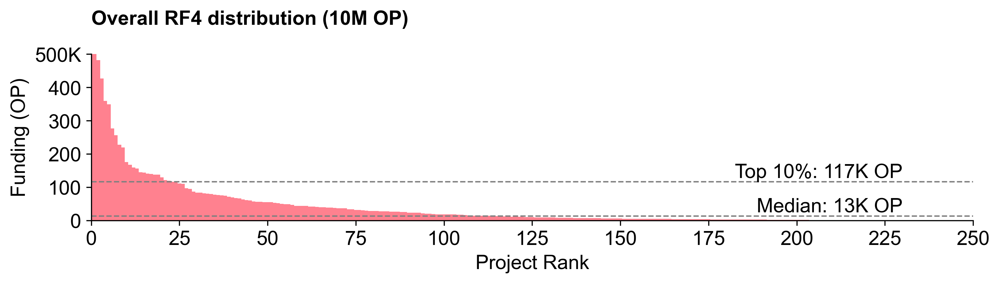

In [9]:
r4_data = pd.read_csv('data/_local/historic/retrofunding4.csv')['amount'] / 1.8
r4_dist = distributions_barchart(
    r4_data,
    title='Overall RF4 distribution (10M OP)',
    xstep=25,
    ymax=500
)

In [10]:
len(r4_data[r4_data < r5_data.min()]) / len(r4_data)

0.6956521739130435

Max: 663853.62
Share to max: 0.022128454265541452


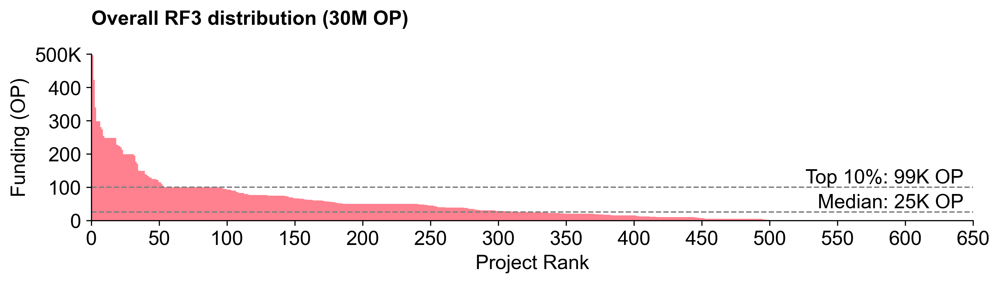

In [11]:
r3_data = pd.read_csv('data/_local/historic/retropgf3.csv')['amount'] / 3.5
r3_dist = distributions_barchart(
    r3_data,
    title='Overall RF3 distribution (30M OP)',
    xstep=50,
    ymax=500
)

print("Max:", r3_data.max())
print("Share to max:", r3_data.max() / r3_data.sum())

Max: 557579.6505
Share to max: 0.018585988573031863


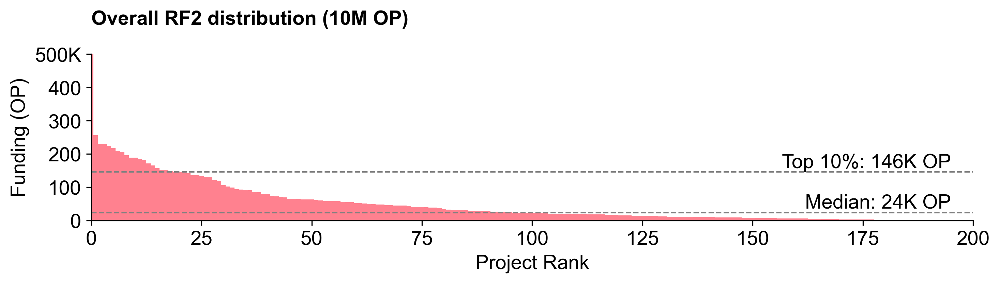

In [12]:
r2_data = pd.read_csv('data/_local/historic/retropgf2.csv')['amount'] * 0.667
r2_dist = distributions_barchart(
    r2_data,
    title='Overall RF2 distribution (10M OP)',
    xstep=25,
    ymax=500
)
print("Max:", r2_data.max())
print("Share to max:", r2_data.max() / r3_data.sum())

# Part 3. Deep dive on ballot variance

In [13]:
projects_in_category_count = df_projects.reset_index().groupby('project_category')['project_id'].nunique().to_dict()
voter_categories = df_voters.reset_index().groupby('op_stack_category')['voter_address'].agg(list).to_dict()
vote_patterns = []
for category, voter_list in voter_categories.items():
    num_projects = projects_in_category_count[category]
    for voter in voter_list:
        dff = df_all_votes[df_all_votes['voter_address'] == voter]
        num_cois = len(dff[dff['project_percentage'].isna()])
        vote_patterns.append({
            'voter_address': voter,
            'category': category,
            'had_coi': num_cois,
            'supported_all_projects': (len(dff[dff['project_percentage'] > 0]) + num_cois) == num_projects,
            'gave_over_15K_to_all': (len(dff[dff['project_amount'] > 15_000]) + num_cois) == num_projects,
            'gave_more_than_125_to_any': len(dff[dff['project_percentage'] > .125]) > 0
        })
        
df_voter_patterns = pd.DataFrame(vote_patterns)
print(df_voter_patterns['supported_all_projects'].mean())
print(df_voter_patterns['gave_over_15K_to_all'].mean())
print(df_voter_patterns['gave_more_than_125_to_any'].mean())

0.8018018018018018
0.5045045045045045
0.26126126126126126


In [14]:
df_voters['variance'] = (
    df.groupby('voter_address')['project_percentage'].std()
    / df.groupby('voter_address')['project_percentage'].mean()
)

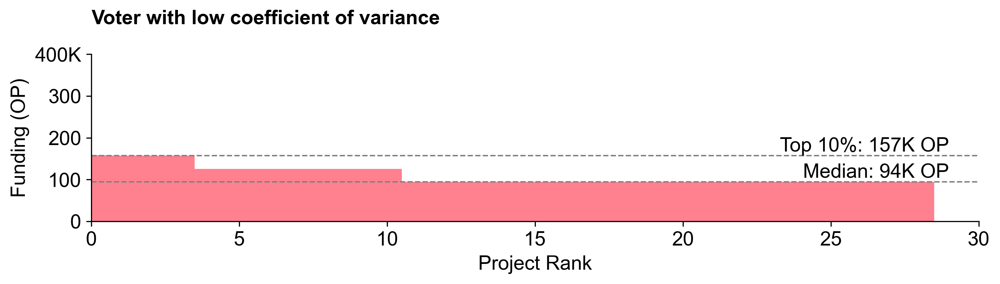

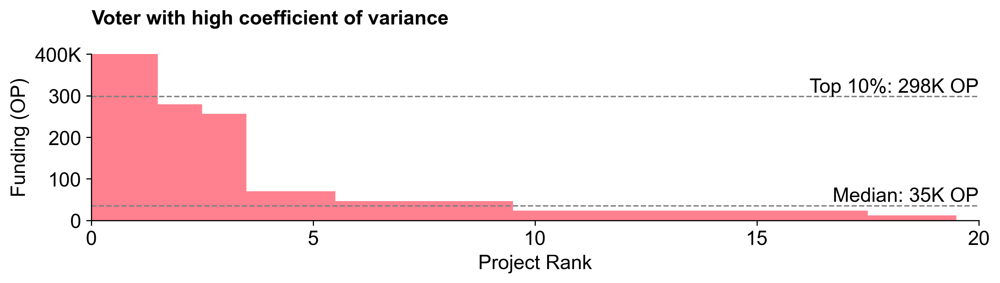

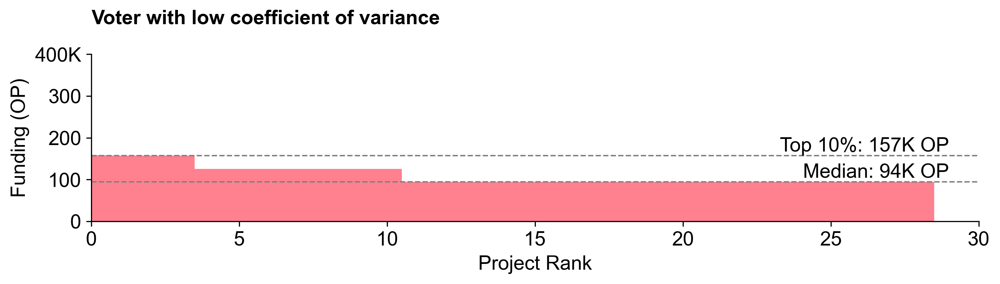

In [15]:
high_cv_voter = df_voters['variance'].sort_values().index[-5]
distributions_barchart(
    df_all_votes[df_all_votes.voter_address == high_cv_voter]['project_amount'],
    title='Voter with high coefficient of variance',
    xstep=5
)

low_cv_voter = df_voters['variance'].sort_values().index[3]
distributions_barchart(
    df_all_votes[df_all_votes.voter_address == low_cv_voter]['project_amount'],
    title='Voter with low coefficient of variance',
    xstep=5
)

## Facet Grid: All voters

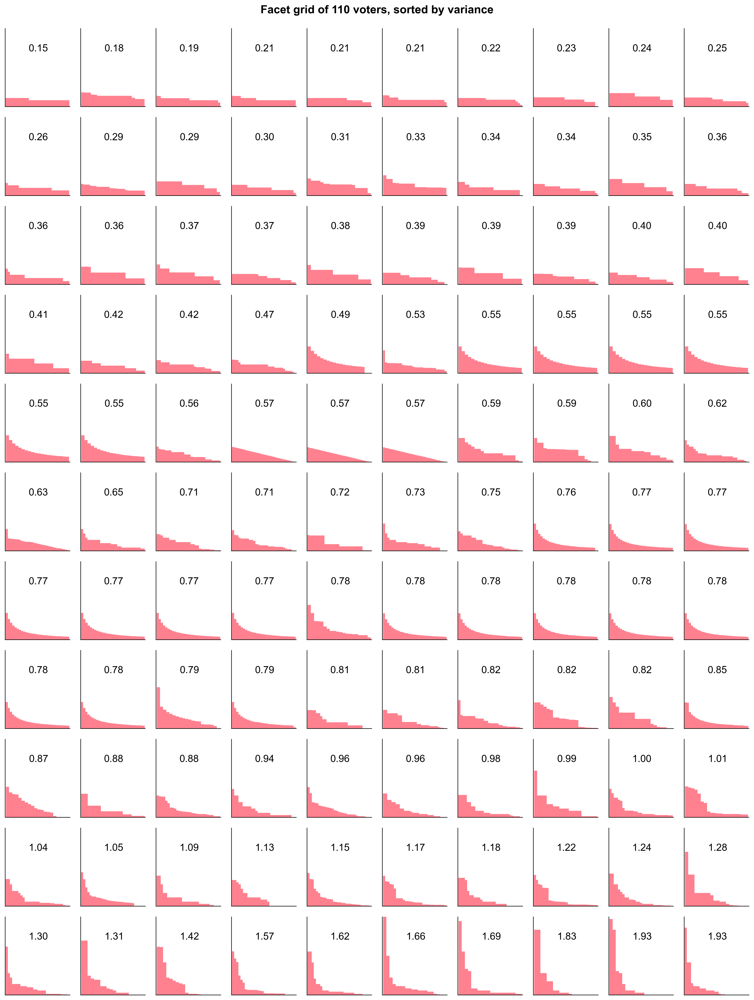

In [16]:
def plot_hist(series, color, ax):
    s = series.sort_values(ascending=False)
    s.plot(kind='bar', color=color, ax=ax, alpha=.5, width=1)
    ax.set_ylim(0,.36)
    ax.set_xticks([])
    ax.set_yticks([])
    
fig, axes = plt.subplots(figsize=(15,20), nrows=11, ncols=10, dpi=300)

for i,(addr,row) in enumerate(df_voters.sort_values(by='variance').head(110).iterrows()):
    ax = axes[i//10, i%10]
    color = '#ff0420'
    series = df[df['voter_address'] == addr]['project_percentage']
    plot_hist(series, color, ax)
    x1, x2 = ax.get_xlim()
    y1, y2 = ax.get_ylim()
    ax.text(x2/2, y2*.8, f"{row['variance']:.2f}", ha='center', va='top')
    
fig.suptitle("Facet grid of 110 voters, sorted by variance\n", weight='bold')    
fig.tight_layout()

## Facet Grid: By Expertise

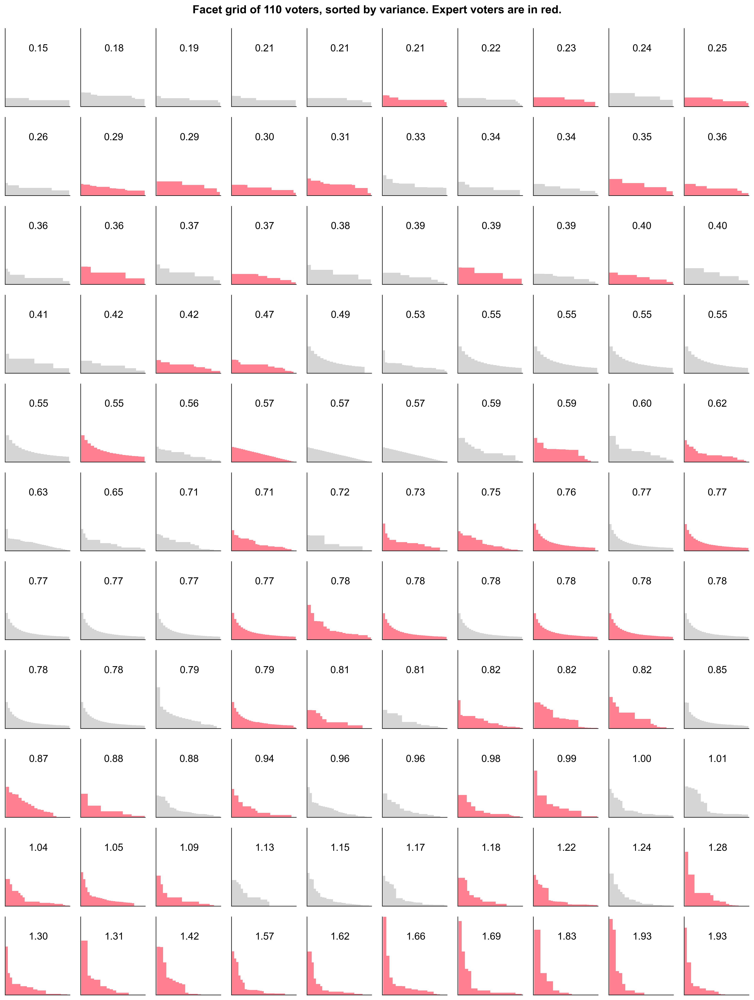

In [17]:
def plot_hist(series, color, ax):
    s = series.sort_values(ascending=False)
    s.plot(kind='bar', color=color, ax=ax, alpha=.5, width=1)
    ax.set_ylim(0,.36)
    ax.set_xticks([])
    ax.set_yticks([])
    
fig, axes = plt.subplots(figsize=(15,20), nrows=11, ncols=10, dpi=300)

for i,(addr,row) in enumerate(df_voters.sort_values(by='variance').head(110).iterrows()):
    ax = axes[i//10, i%10]
    color = '#ff0420' if row['expertise_group'] == 'Expert' else '#aaa'
    series = df[df['voter_address'] == addr]['project_percentage']
    plot_hist(series, color, ax)
    x1, x2 = ax.get_xlim()
    y1, y2 = ax.get_ylim()
    ax.text(x2/2, y2*.8, f"{row['variance']:.2f}", ha='center', va='top')
    
fig.suptitle("Facet grid of 110 voters, sorted by variance. Expert voters are in red.\n", weight='bold')    
fig.tight_layout()

# Experts vs Non-experts

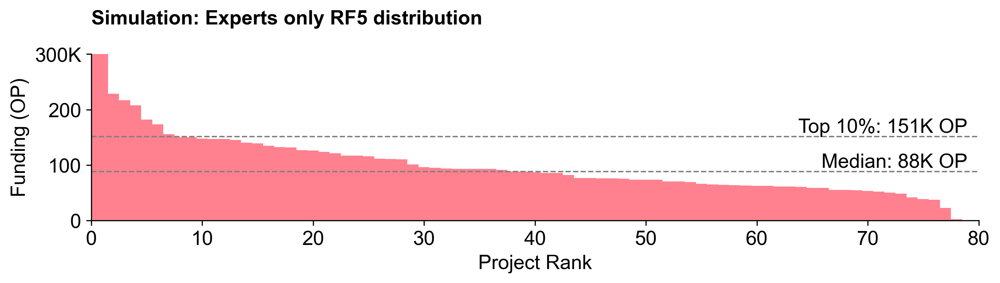

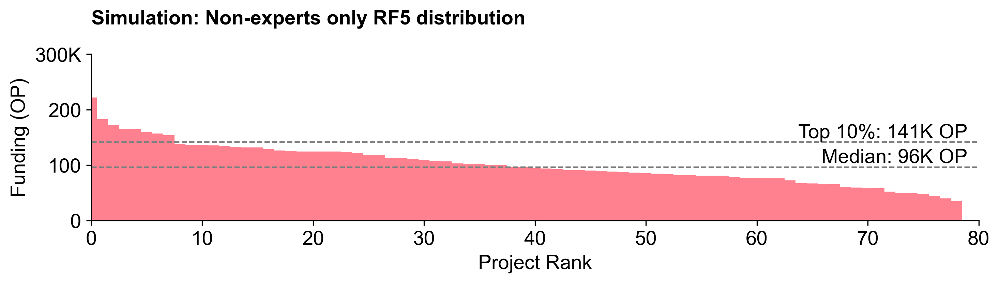

In [18]:
experts_distribution = simulate_rf5_scorer(voting_data, df_voters[df_voters['is_expert']].index)
f1 = distributions_barchart(
    experts_distribution['rf5_rewards'],
    "Simulation: Experts only RF5 distribution",
    ymax=300,
    xstep=10
)

nonexperts_distribution = simulate_rf5_scorer(voting_data, df_voters[~df_voters['is_expert']].index)
f2 = distributions_barchart(
    nonexperts_distribution['rf5_rewards'],
    "Simulation: Non-experts only RF5 distribution",
    ymax=300,
    xstep=10
)

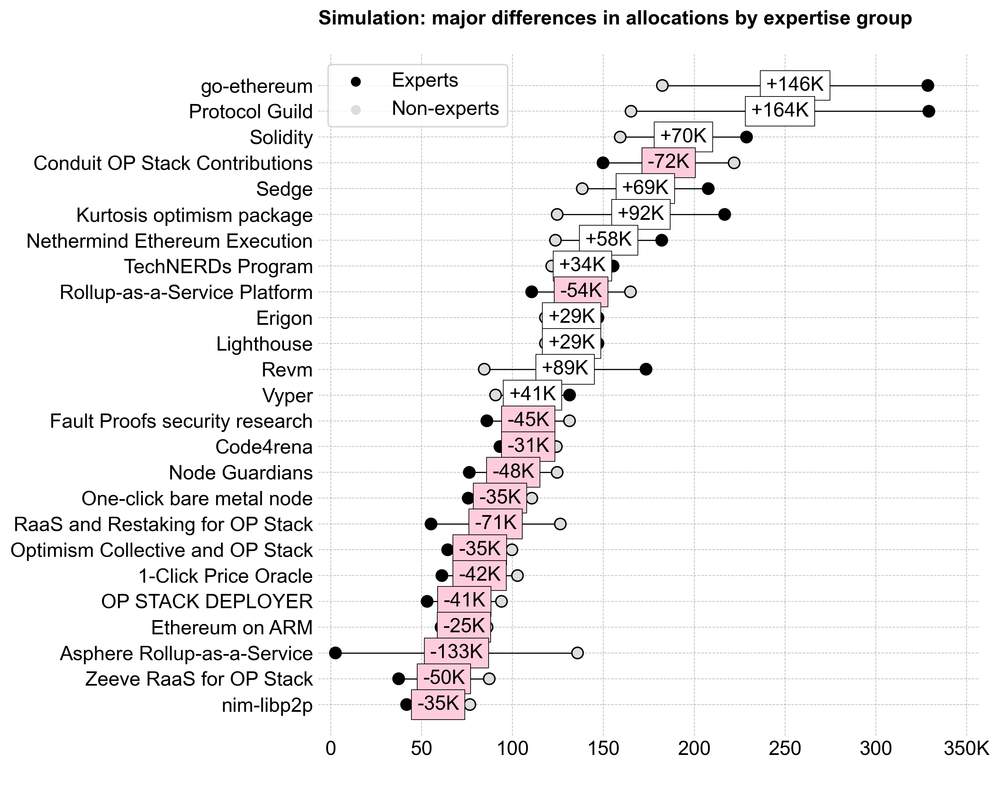

In [19]:
dist_compare = pd.concat([
    experts_distribution,
    nonexperts_distribution
], axis=1)
dist_compare.columns = ['Experts', 'Non-experts']
deltas = abs(dist_compare['Experts'] - dist_compare['Non-experts'])
high_deltas = deltas>=25000
dist_compare = dist_compare[high_deltas]

dist_compare.reset_index(inplace=True)
dist_compare = dist_compare.melt(
    id_vars='project_id',
    value_vars=['Experts', 'Non-experts'],
    var_name='expertise_group',
    value_name='project_amount'
).set_index('project_id').join(df_projects)

plot_medians_by_voter_group(
    dist_compare,
    xcol='project_amount',
    xmax=350,
    xstep=50,
    subtitle='Simulation: major differences in allocations by expertise group'
)    

Text(0.0, 1.0, "Standard deviation in how much a 'divisive' project should recieve\n")

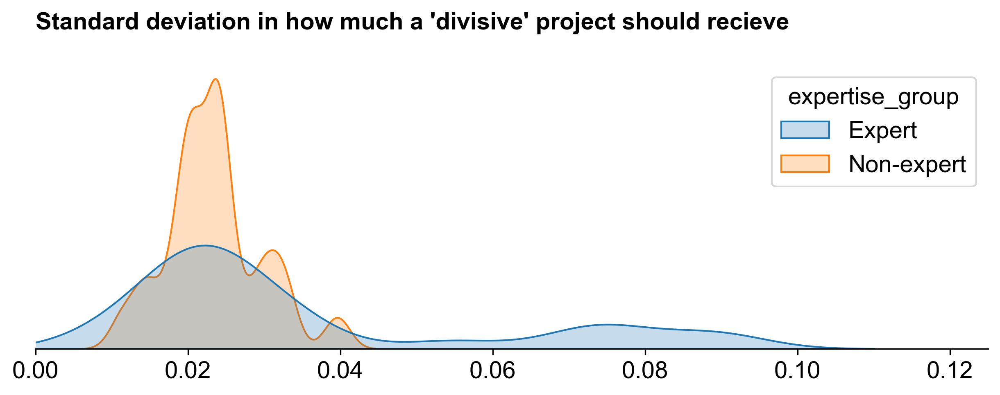

In [20]:
divisive_list = dist_compare.index.unique()
fig, ax = plt.subplots(figsize=(10, 3), dpi=300)
sns.kdeplot(
    data=(
        df[df.project_id.isin(divisive_list)]
        .groupby(['project_name', 'expertise_group'])
        ['project_percentage']
        .std().reset_index()
    ),
    x='project_percentage',
    hue='expertise_group',
    fill=True,
    common_norm=False,
    bw_adjust=0.5,
    ax=ax
)
format_axis(ax, xmin=0, xmax=.125, xpost='%')
ax.set_ylabel("")
ax.set_xlabel("")
ax.spines['left'].set_visible(False)
ax.set_yticks([])
ax.set_title(f"Standard deviation in how much a 'divisive' project should recieve\n", loc='left', weight='bold')

# Part 4. Category deep dives

In [21]:
category_votes = []
categories = set()
for ballot in voting_data:
    cat = ballot['category_assignment']
    categories.add(cat)
    b = {
        'voter_address': ballot['voter_address'],
        'category_assignment': cat
    }
    for category_alloc in ballot['category_allocations']:
        b.update(category_alloc)
    category_votes.append(b)

df_category_votes = pd.DataFrame(category_votes)
for category in categories:
    df_category_votes[category] = pd.to_numeric(df_category_votes[category])

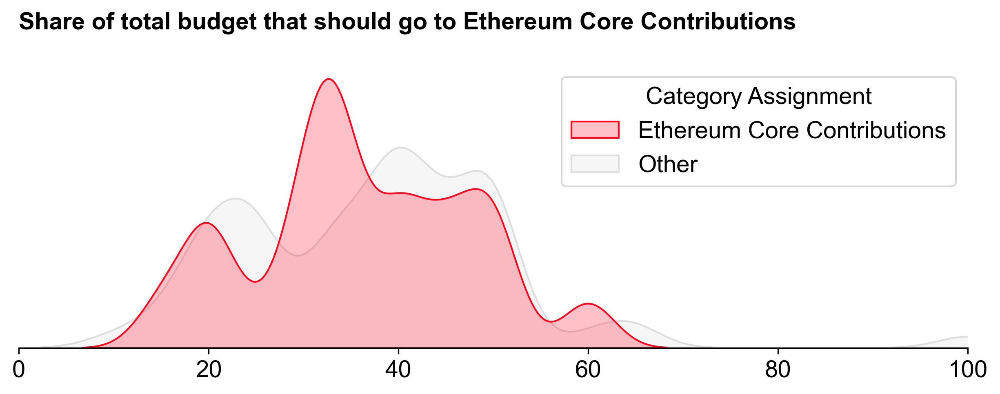

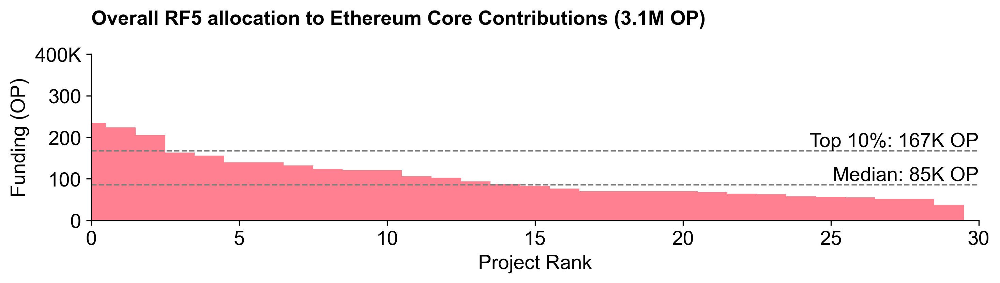

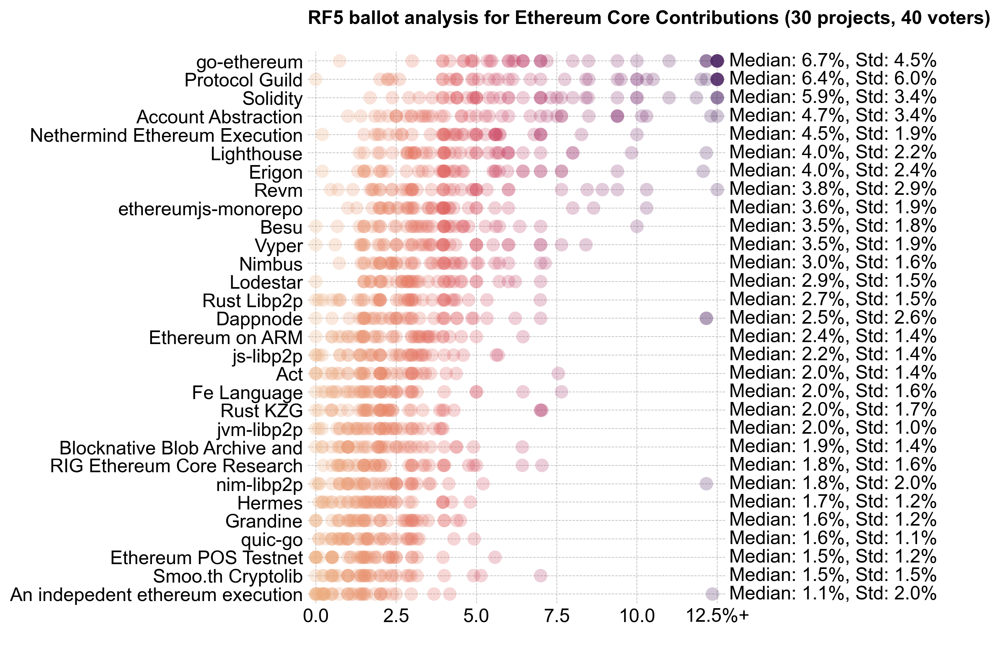

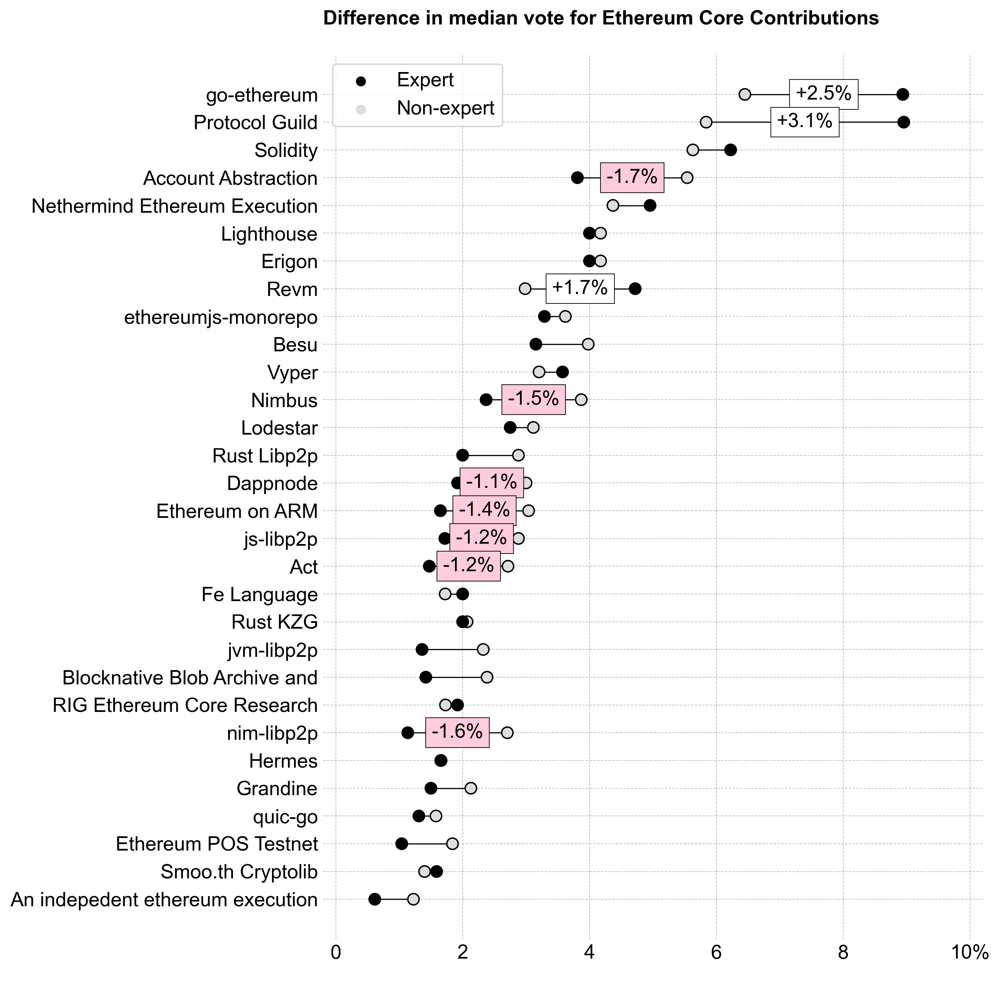

In [22]:
category = 'Ethereum Core Contributions'

f_cat = category_kde_plots(df_category_votes, category)

r5_category_results = r5_data[r5_data.index.isin(df_projects[df_projects['project_category'] == category].index)]

f_dist = distributions_barchart(
    r5_category_results,
    title=f"Overall RF5 allocation to {category} ({r5_category_results.sum()/1_000_000:.1f}M OP)"
)

f_ballot = plot_ballots_by_project_category(
    df[df.project_category == category],
    xcol='project_percentage',
    subtitle=f"RF5 ballot analysis for {category}"
)

f_experts = plot_medians_by_voter_group(
    df[df.project_category == category],
    xcol='project_percentage',
    subtitle=f"Difference in median vote for {category}"
)    

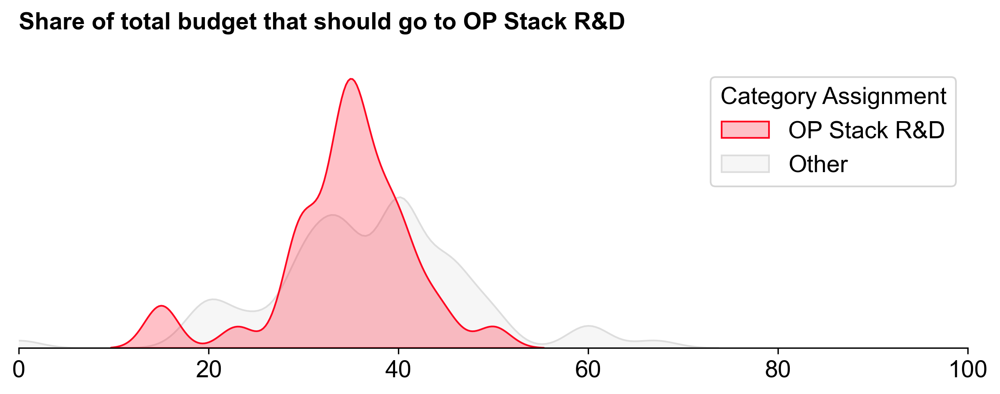

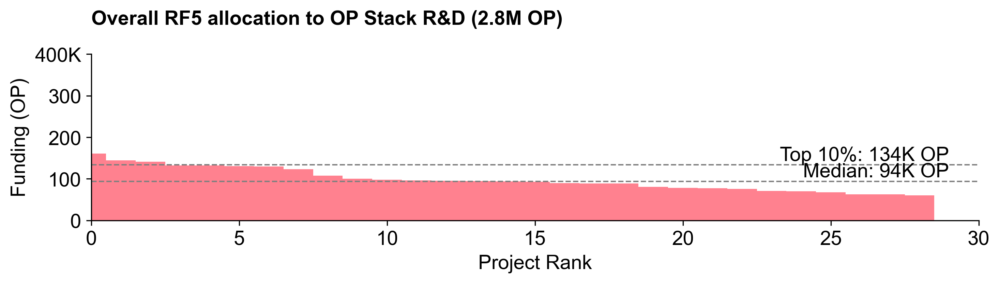

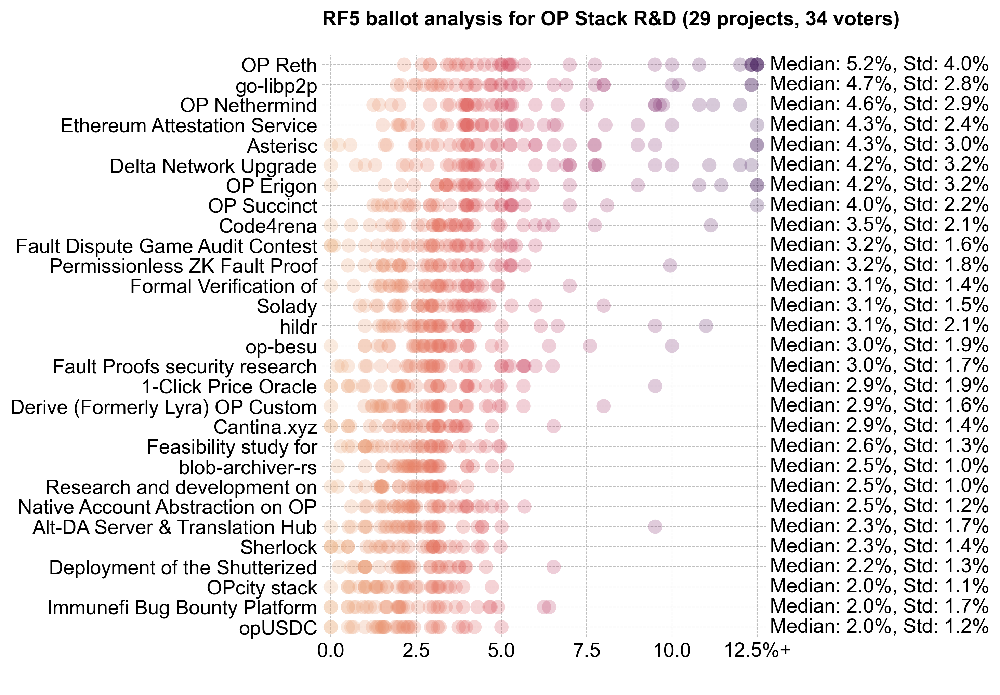

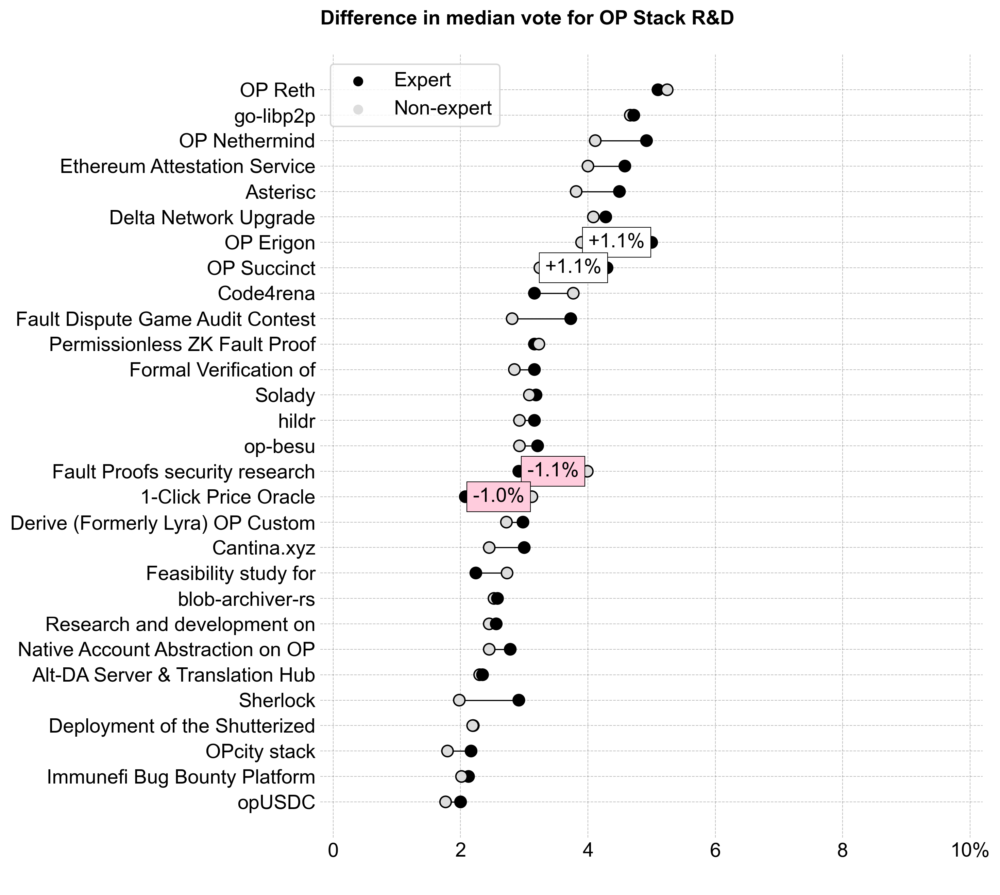

In [23]:
category =  'OP Stack R&D'

f_cat = category_kde_plots(df_category_votes, category)

r5_category_results = r5_data[r5_data.index.isin(df_projects[df_projects['project_category'] == category].index)]

f_dist = distributions_barchart(
    r5_category_results,
    title=f"Overall RF5 allocation to {category} ({r5_category_results.sum()/1_000_000:.1f}M OP)"
)

f_ballot = plot_ballots_by_project_category(
    df[df.project_category == category],
    xcol='project_percentage',
    subtitle=f"RF5 ballot analysis for {category}"
)

f_experts = plot_medians_by_voter_group(
    df[df.project_category == category],
    xcol='project_percentage',
    subtitle=f"Difference in median vote for {category}"
)    

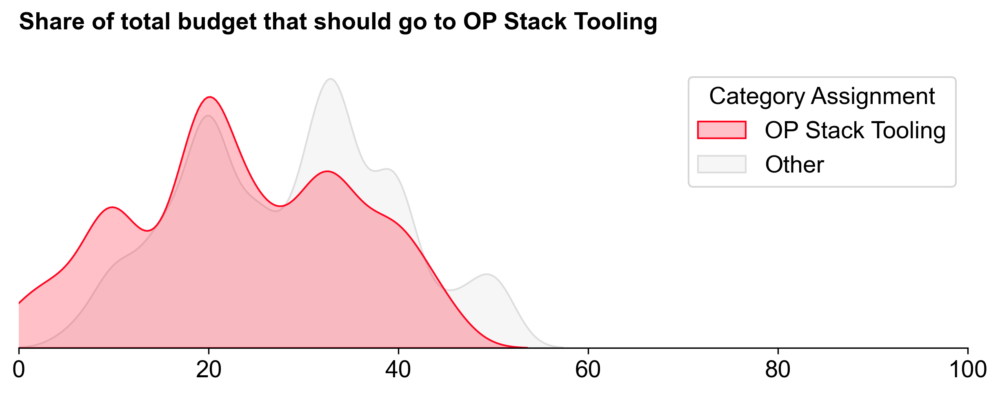

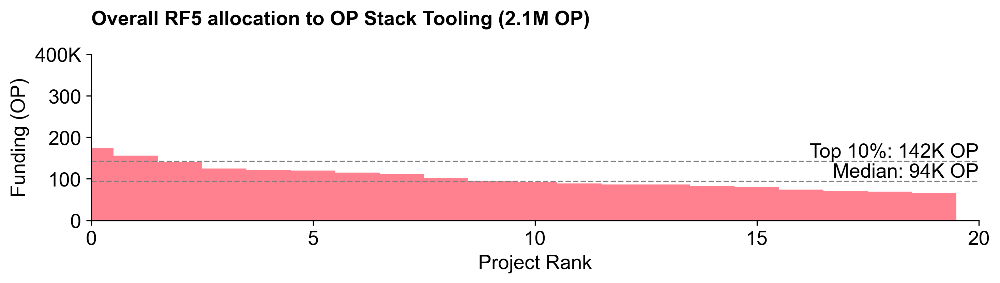

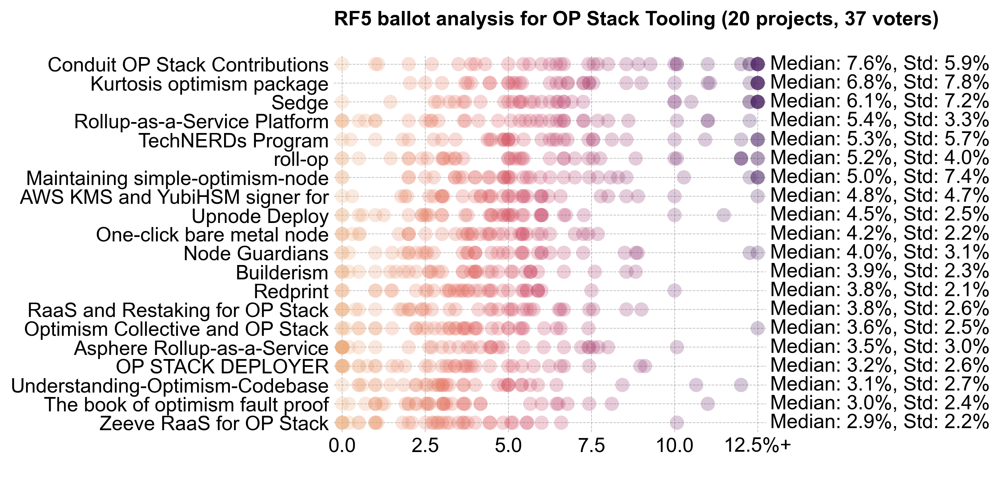

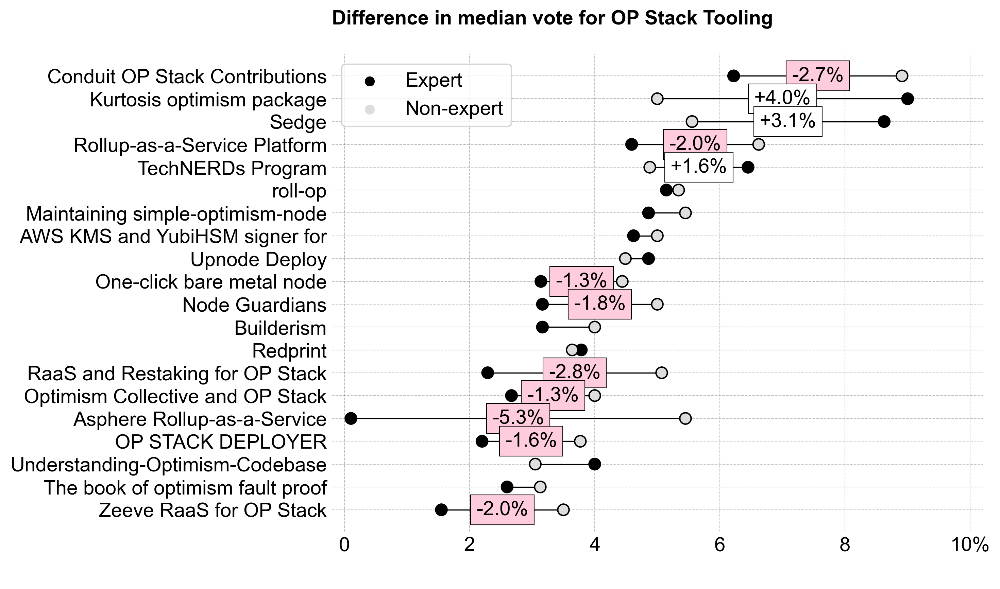

In [24]:
category = 'OP Stack Tooling'

f_cat = category_kde_plots(df_category_votes, category)

r5_category_results = r5_data[r5_data.index.isin(df_projects[df_projects['project_category'] == category].index)]

f_dist = distributions_barchart(
    r5_category_results,
    title=f"Overall RF5 allocation to {category} ({r5_category_results.sum()/1_000_000:.1f}M OP)"
)

f_ballot = plot_ballots_by_project_category(
    df[df.project_category == category],
    xcol='project_percentage',
    subtitle=f"RF5 ballot analysis for {category}"
)

f_experts = plot_medians_by_voter_group(
    df[df.project_category == category],
    xcol='project_percentage',
    subtitle=f"Difference in median vote for {category}"
)    

# Part 5. Backup

Text(0.0, 1.0, 'Given the design of this round, how confident do you feel that rewards will be\nallocated efficiently to the most deserving projects?\n')

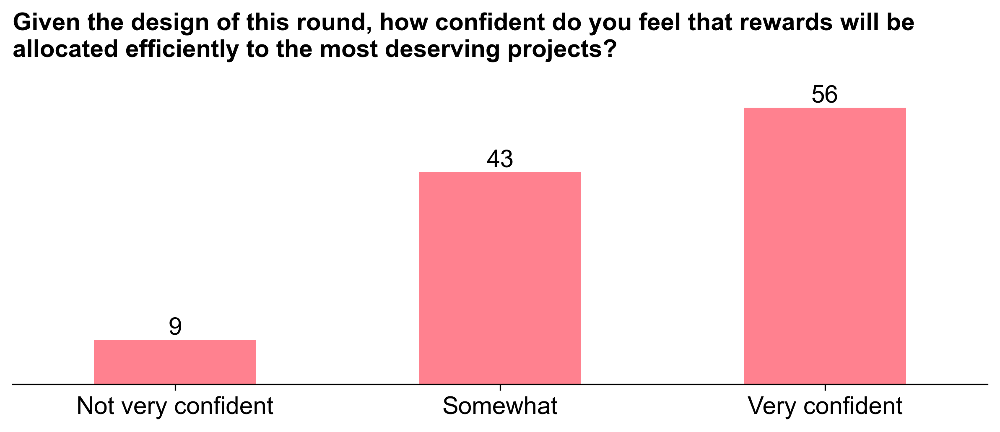

In [25]:
bins = [0, 2, 4, float('inf')]
labels = ['Not very confident', 'Somewhat', 'Very confident']

survey_categories = pd.cut(df_voters['survey_rate_confidence_results'], bins=bins, labels=labels)
crosstab_survey = pd.crosstab(survey_categories, columns="count")

fig, ax = get_plot(crosstab_survey, kind='bar', color='#ff0420', alpha=.5)

ax.legend().remove()
ax.tick_params(axis='x', rotation=0)
ax.set_xlabel("")

ax.set_ylabel("")
ax.spines['left'].set_visible(False)
ax.set_yticks([])

for bars in ax.containers:
    labels = [f'{int(v)}' if v > 0 else '' for v in bars.datavalues]
    ax.bar_label(bars, labels=labels, label_type='edge')

question = "Given the design of this round, how confident do you feel that rewards will be\nallocated efficiently to the most deserving projects?"
ax.set_title(f"{question}\n", loc='left', weight='bold')

<Axes: xlabel='expertise_score', ylabel='survey_rate_confidence_results'>

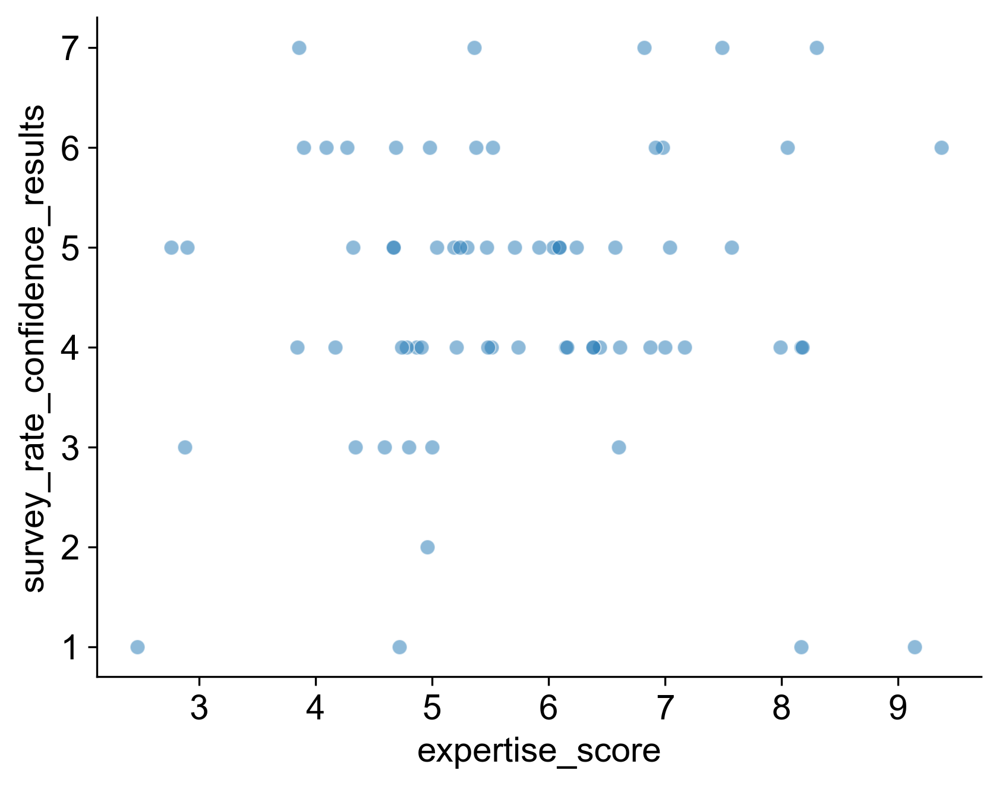

In [26]:
sns.scatterplot(
    x=df_voters['expertise_score'],
    y=df_voters['survey_rate_confidence_results'],
    alpha=.5
)

## Facet Grid: Pairwise

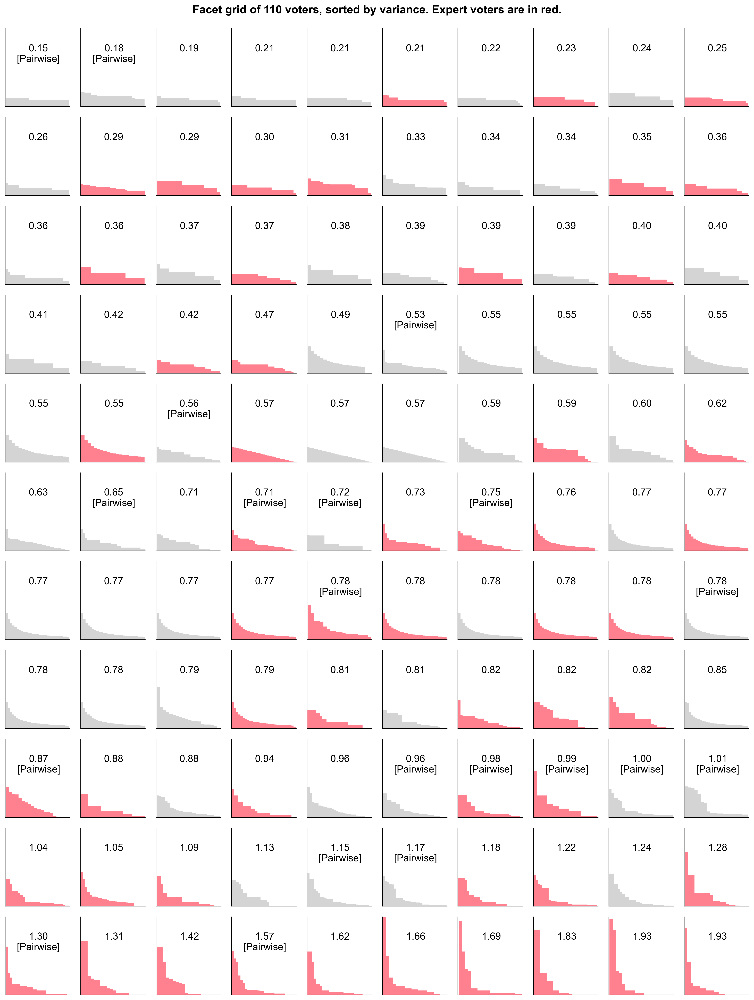

In [27]:
fig, axes = plt.subplots(figsize=(15,20), nrows=11, ncols=10, dpi=300)

for i,(addr,row) in enumerate(df_voters.sort_values(by='variance').head(110).iterrows()):
    ax = axes[i//10, i%10]
    series = df[df['voter_address'] == addr]['project_percentage']
    color = '#ff0420' if row['expertise_group'] == 'Expert' else '#aaa'
    text = f"{row['variance']:.2f}"
    if row['used_pairwise']:
        text = f"{text}\n[Pairwise]"
    plot_hist(series, color, ax)
    x1, x2 = ax.get_xlim()
    y1, y2 = ax.get_ylim()
    ax.text(x2/2, y2*.8, text, ha='center', va='top')
    
fig.suptitle("Facet grid of 110 voters, sorted by variance. Expert voters are in red.\n", weight='bold')    
fig.tight_layout()

## Absolutes vs percentages

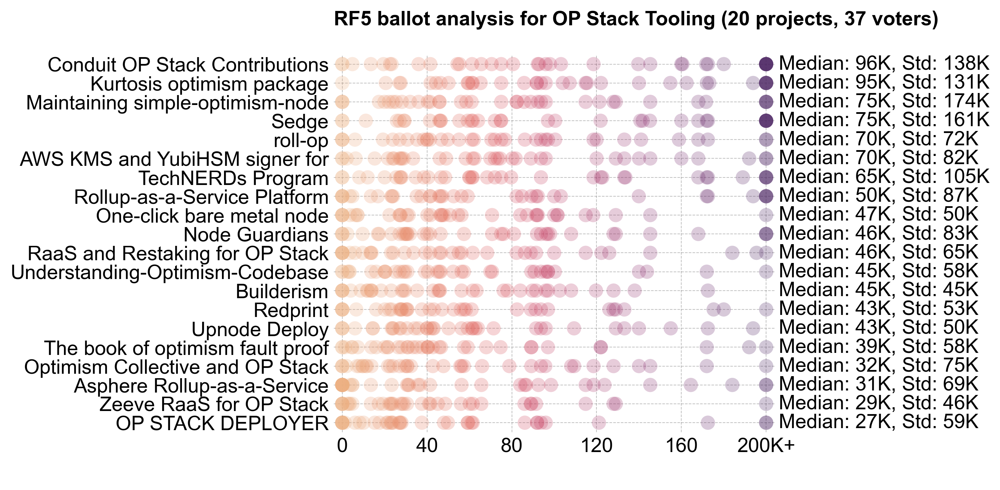

In [28]:
category = 'OP Stack Tooling'

f_ballot = plot_ballots_by_project_category(
    df[df.project_category == category],
    xcol='project_amount',
    subtitle=f"RF5 ballot analysis for {category}"
)

## Funding by project

In [29]:
df_funding = pd.read_csv('../../../../oss-funding/data/funding_data.csv')
df_funding = df_funding[df_funding['grant_pool_name'].isin(['retropgf3', 'retrofunding5'])]

df_funding['metadata'] = df_funding['metadata'].apply(lambda x: json.loads(x))
df_funding['token_amount'] = df_funding['metadata'].apply(lambda x: x.get('token_amount'))
df_funding['application_name'] = df_funding['metadata'].apply(lambda x: x.get('token_amount'))

rf5_oso_names = df_funding[df_funding['grant_pool_name'] == 'retrofunding5']['to_project_name'].dropna().unique()
df_funding = df_funding[df_funding['to_project_name'].isin(rf5_oso_names)]

In [30]:
df_funding[df_funding['grant_pool_name'] == 'retrofunding5'].groupby('to_project_name')['token_amount'].count().sort_values().tail(5)

to_project_name
optimism         2
testinprod-io    2
nethermindeth    3
upnodedev        3
libp2p           4
Name: token_amount, dtype: int64

In [31]:
round(
    df_funding
    .pivot_table(
        columns='grant_pool_name',
        index='to_project_name',
        values='token_amount',
        aggfunc='sum'
    )
    .dropna()
    .sort_values(by='retrofunding5', ascending=False)
    .applymap(lambda x: int(x/1000))
)

grant_pool_name,retrofunding5,retropgf3
to_project_name,,
nethermindeth,438,248
libp2p,384,298
upnodedev,285,62
testinprod-io,260,273
go-ethereum,234,496
protocol-guild,223,663
gelato,214,76
solidity-ethereum,204,422
eth-infinitism-account-abstraction,163,248
